In [1]:
%matplotlib inline

# install pillow
!pip uninstall -y Pillow
!pip install Pillow==4.1.1

# download and unzip dataset o train
!wget http://images.cocodataset.org/zips/train2014.zip
!mkdir train
%cd /content/train
!unzip -qq /content/train2014.zip
%cd ..

#download model
!wget https://web.eecs.umich.edu/~justincj/models/vgg16-00b39a1b.pth
  
# download helper code
!wget https://raw.githubusercontent.com/iamRusty/fast-neural-style-pytorch/master/transformer.py
!wget https://raw.githubusercontent.com/iamRusty/fast-neural-style-pytorch/master/experimental.py
!wget https://raw.githubusercontent.com/iamRusty/fast-neural-style-pytorch/master/utils.py
!wget https://raw.githubusercontent.com/iamRusty/fast-neural-style-pytorch/master/vgg.py

# download style image  
!wget https://raw.githubusercontent.com/iamRusty/fast-neural-style-pytorch/master/images/mosaic.jpg

Uninstalling Pillow-4.3.0:
  Successfully uninstalled Pillow-4.3.0
    100% |████████████████████████████████| 5.7MB 6.3MB/s 
scikit-image 0.14.2 has requirement pillow>=4.3.0, but you'll have pillow 4.1.1 which is incompatible.
albumentations 0.1.12 has requirement imgaug<0.2.7,>=0.2.5, but you'll have imgaug 0.2.8 which is incompatible.


--2019-04-19 23:51:11--  http://images.cocodataset.org/zips/train2014.zip
Resolving images.cocodataset.org (images.cocodataset.org)... 52.216.129.227
Connecting to images.cocodataset.org (images.cocodataset.org)|52.216.129.227|:80... connected.
HTTP request sent, awaiting response... 200 OK
Length: 13510573713 (13G) [application/zip]
Saving to: ‘train2014.zip’

train2014.zip       100%[===================>]  12.58G  45.7MB/s    in 4m 52s  

2019-04-19 23:56:03 (44.2 MB/s) - ‘train2014.zip’ saved [13510573713/13510573713]

/content/train
/content
--2019-04-19 23:59:59--  https://s3-us-west-2.amazonaws.com/jcjohns-models/vgg16-00b39a1b.pth
Resolving s3-us-west-2.amazonaws.com (s3-us-west-2.amazonaws.com)... 52.218.225.0
Connecting to s3-us-west-2.amazonaws.com (s3-us-west-2.amazonaws.com)|52.218.225.0|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 553451520 (528M) [application/octet-stream]
Saving to: ‘vgg16-00b39a1b.pth’

vgg16-00b39a1b.pth  100%[=============

In [0]:
import PIL
from PIL import Image
import matplotlib.pyplot as plt
import os
import cv2
import torch
import torch.nn as nn
import torch.optim as optim
from torchvision import datasets, transforms, models
import random
import numpy as np
import time
import vgg
import transformer
import experimental
import utils

In [0]:
# GLOBAL SETTINGS
TRAIN_IMAGE_SIZE = 256
DATASET_PATH = "/content/train"
NUM_EPOCHS = 1
STYLE_IMAGE_PATH = "/content/mosaic.jpg"
BATCH_SIZE = 4 
CONTENT_WEIGHT = 17
STYLE_WEIGHT = 50
TV_WEIGHT = 1e-6 
ADAM_LR = 0.001
SAVE_MODEL_PATH = "/content/"
SAVE_IMAGE_PATH = "/content/"
SAVE_MODEL_EVERY = 500 # 2,000 Images with batch size 4
SEED = 35

========Epoch 1/2========
========Iteration 1/20696========
	Content Loss:	2741175.00
	Style Loss:	201287344.00
	Total Loss:	204028512.00
Time elapsed:	0.39722228050231934 seconds
Saved TransformerNetwork checkpoint file at /content/checkpoint_0.pth


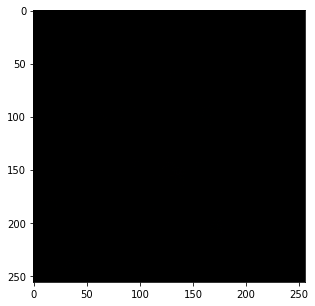

Saved sample tranformed image at /content/sample0_0.png
========Iteration 501/20696========
	Content Loss:	5799131.50
	Style Loss:	112644712.00
	Total Loss:	118443897.25
Time elapsed:	81.26671242713928 seconds
Saved TransformerNetwork checkpoint file at /content/checkpoint_500.pth


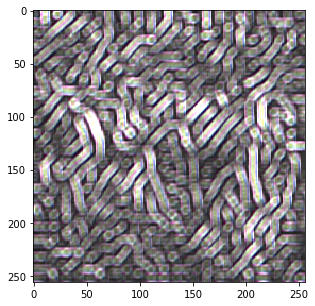

Saved sample tranformed image at /content/sample0_500.png
========Iteration 1001/20696========
	Content Loss:	7570281.00
	Style Loss:	74256760.00
	Total Loss:	81827004.37
Time elapsed:	164.05720615386963 seconds
Saved TransformerNetwork checkpoint file at /content/checkpoint_1000.pth


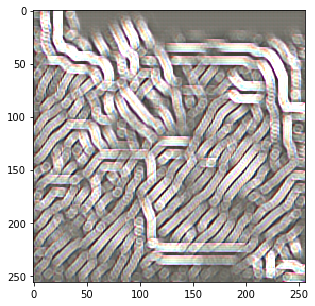

Saved sample tranformed image at /content/sample0_1000.png
========Iteration 1501/20696========
	Content Loss:	8322236.50
	Style Loss:	56937516.00
	Total Loss:	65259774.48
Time elapsed:	247.0692653656006 seconds
Saved TransformerNetwork checkpoint file at /content/checkpoint_1500.pth


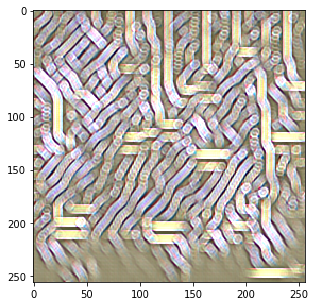

Saved sample tranformed image at /content/sample0_1500.png
========Iteration 2001/20696========
	Content Loss:	8736773.00
	Style Loss:	46465440.00
	Total Loss:	55202226.08
Time elapsed:	330.7366645336151 seconds
Saved TransformerNetwork checkpoint file at /content/checkpoint_2000.pth


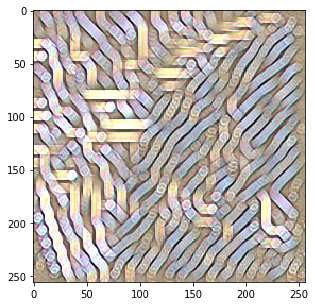

Saved sample tranformed image at /content/sample0_2000.png
========Iteration 2501/20696========
	Content Loss:	8994393.00
	Style Loss:	39597388.00
	Total Loss:	48591773.48
Time elapsed:	416.38995695114136 seconds
Saved TransformerNetwork checkpoint file at /content/checkpoint_2500.pth


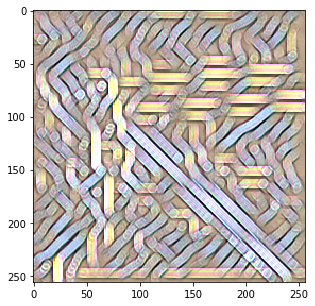

Saved sample tranformed image at /content/sample0_2500.png
========Iteration 3001/20696========
	Content Loss:	9167057.00
	Style Loss:	34761072.00
	Total Loss:	43928138.55
Time elapsed:	501.81999826431274 seconds
Saved TransformerNetwork checkpoint file at /content/checkpoint_3000.pth


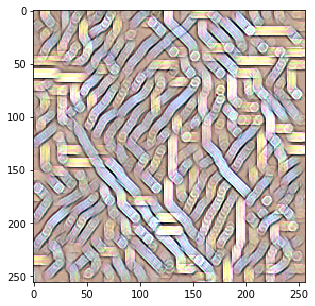

Saved sample tranformed image at /content/sample0_3000.png
========Iteration 3501/20696========
	Content Loss:	9281018.00
	Style Loss:	31121012.00
	Total Loss:	40402016.15
Time elapsed:	586.5538785457611 seconds
Saved TransformerNetwork checkpoint file at /content/checkpoint_3500.pth


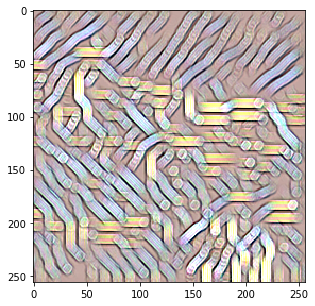

Saved sample tranformed image at /content/sample0_3500.png
========Iteration 4001/20696========
	Content Loss:	9364847.00
	Style Loss:	28275592.00
	Total Loss:	37640419.20
Time elapsed:	670.37442278862 seconds
Saved TransformerNetwork checkpoint file at /content/checkpoint_4000.pth


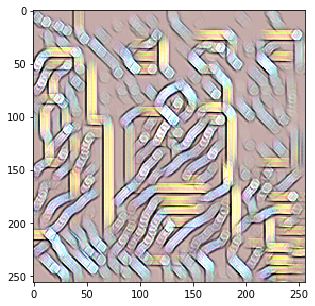

Saved sample tranformed image at /content/sample0_4000.png
========Iteration 4501/20696========
	Content Loss:	9426379.00
	Style Loss:	25994686.00
	Total Loss:	35421039.29
Time elapsed:	754.0276436805725 seconds
Saved TransformerNetwork checkpoint file at /content/checkpoint_4500.pth


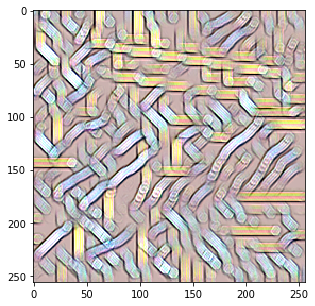

Saved sample tranformed image at /content/sample0_4500.png
========Iteration 5001/20696========
	Content Loss:	9468573.00
	Style Loss:	24128802.00
	Total Loss:	33597335.71
Time elapsed:	837.4146492481232 seconds
Saved TransformerNetwork checkpoint file at /content/checkpoint_5000.pth


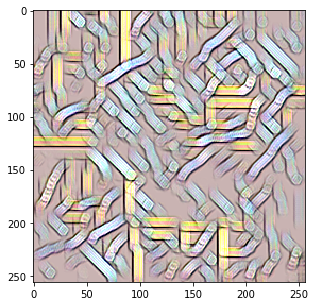

Saved sample tranformed image at /content/sample0_5000.png
========Iteration 5501/20696========
	Content Loss:	9504408.00
	Style Loss:	22574434.00
	Total Loss:	32078795.94
Time elapsed:	920.0677487850189 seconds
Saved TransformerNetwork checkpoint file at /content/checkpoint_5500.pth


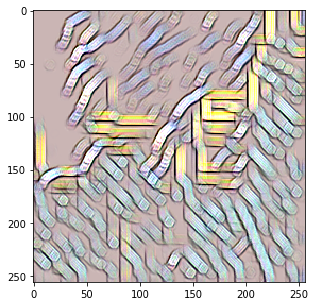

Saved sample tranformed image at /content/sample0_5500.png
========Iteration 6001/20696========
	Content Loss:	9528924.00
	Style Loss:	21257560.00
	Total Loss:	30786438.57
Time elapsed:	1002.4239888191223 seconds
Saved TransformerNetwork checkpoint file at /content/checkpoint_6000.pth


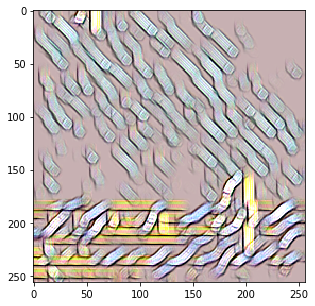

Saved sample tranformed image at /content/sample0_6000.png
========Iteration 6501/20696========
	Content Loss:	9548010.00
	Style Loss:	20121610.00
	Total Loss:	29669577.88
Time elapsed:	1084.2109277248383 seconds
Saved TransformerNetwork checkpoint file at /content/checkpoint_6500.pth


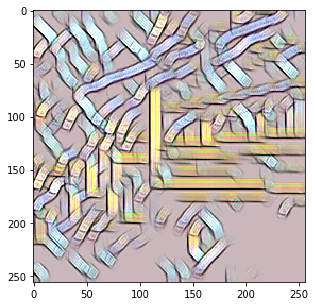

Saved sample tranformed image at /content/sample0_6500.png
========Iteration 7001/20696========
	Content Loss:	9560245.00
	Style Loss:	19131546.00
	Total Loss:	28691746.15
Time elapsed:	1166.127775669098 seconds
Saved TransformerNetwork checkpoint file at /content/checkpoint_7000.pth


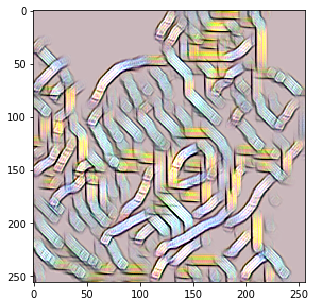

Saved sample tranformed image at /content/sample0_7000.png
========Iteration 7501/20696========
	Content Loss:	9569839.00
	Style Loss:	18264286.00
	Total Loss:	27834087.06
Time elapsed:	1247.6527826786041 seconds
Saved TransformerNetwork checkpoint file at /content/checkpoint_7500.pth


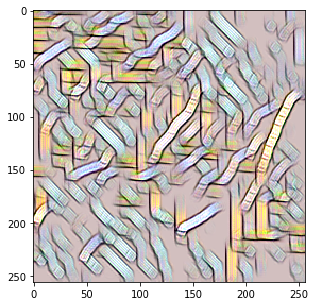

Saved sample tranformed image at /content/sample0_7500.png
========Iteration 8001/20696========
	Content Loss:	9576191.00
	Style Loss:	17490838.00
	Total Loss:	27066992.10
Time elapsed:	1329.988437652588 seconds
Saved TransformerNetwork checkpoint file at /content/checkpoint_8000.pth


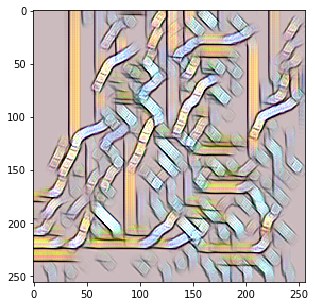

Saved sample tranformed image at /content/sample0_8000.png
========Iteration 8501/20696========
	Content Loss:	9580583.00
	Style Loss:	16801026.00
	Total Loss:	26381562.49
Time elapsed:	1412.002623796463 seconds
Saved TransformerNetwork checkpoint file at /content/checkpoint_8500.pth


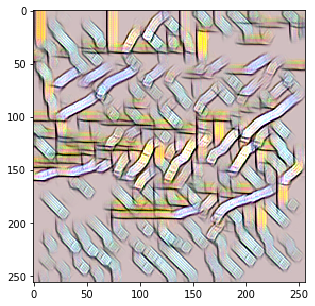

Saved sample tranformed image at /content/sample0_8500.png
========Iteration 9001/20696========
	Content Loss:	9582837.00
	Style Loss:	16178862.00
	Total Loss:	25761659.97
Time elapsed:	1493.9187235832214 seconds
Saved TransformerNetwork checkpoint file at /content/checkpoint_9000.pth


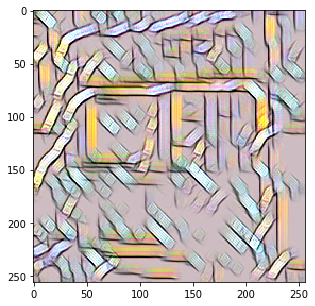

Saved sample tranformed image at /content/sample0_9000.png
========Iteration 9501/20696========
	Content Loss:	9583182.00
	Style Loss:	15614844.00
	Total Loss:	25197971.91
Time elapsed:	1575.7951593399048 seconds
Saved TransformerNetwork checkpoint file at /content/checkpoint_9500.pth


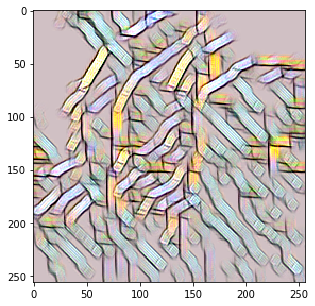

Saved sample tranformed image at /content/sample0_9500.png
========Iteration 10001/20696========
	Content Loss:	9584157.00
	Style Loss:	15103435.00
	Total Loss:	24687520.51
Time elapsed:	1657.5076212882996 seconds
Saved TransformerNetwork checkpoint file at /content/checkpoint_10000.pth


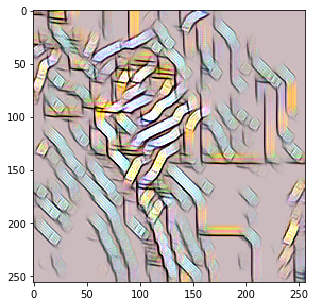

Saved sample tranformed image at /content/sample0_10000.png
========Iteration 10501/20696========
	Content Loss:	9583857.00
	Style Loss:	14633682.00
	Total Loss:	24217481.02
Time elapsed:	1739.1323056221008 seconds
Saved TransformerNetwork checkpoint file at /content/checkpoint_10500.pth


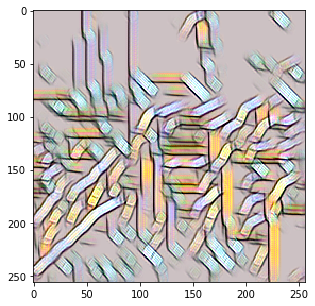

Saved sample tranformed image at /content/sample0_10500.png
========Iteration 11001/20696========
	Content Loss:	9581992.00
	Style Loss:	14203992.00
	Total Loss:	23785900.09
Time elapsed:	1820.9759285449982 seconds
Saved TransformerNetwork checkpoint file at /content/checkpoint_11000.pth


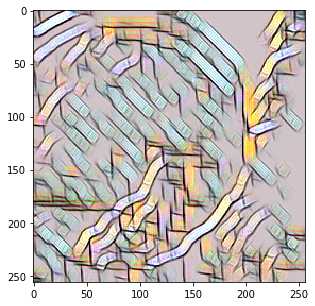

Saved sample tranformed image at /content/sample0_11000.png
========Iteration 11501/20696========
	Content Loss:	9580682.00
	Style Loss:	13809214.00
	Total Loss:	23389827.84
Time elapsed:	1902.8857748508453 seconds
Saved TransformerNetwork checkpoint file at /content/checkpoint_11500.pth


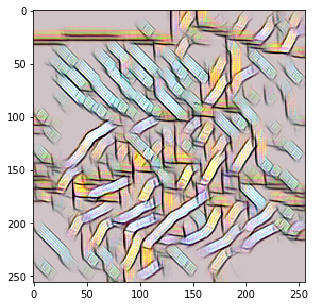

Saved sample tranformed image at /content/sample0_11500.png
========Iteration 12001/20696========
	Content Loss:	9578824.00
	Style Loss:	13442771.00
	Total Loss:	23021530.55
Time elapsed:	1984.5645594596863 seconds
Saved TransformerNetwork checkpoint file at /content/checkpoint_12000.pth


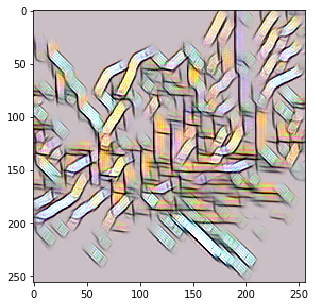

Saved sample tranformed image at /content/sample0_12000.png
========Iteration 12501/20696========
	Content Loss:	9578218.00
	Style Loss:	13104503.00
	Total Loss:	22682652.34
Time elapsed:	2066.0893256664276 seconds
Saved TransformerNetwork checkpoint file at /content/checkpoint_12500.pth


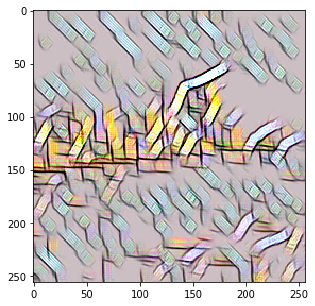

Saved sample tranformed image at /content/sample0_12500.png
========Iteration 13001/20696========
	Content Loss:	9574595.00
	Style Loss:	12789280.00
	Total Loss:	22363819.40
Time elapsed:	2147.802443742752 seconds
Saved TransformerNetwork checkpoint file at /content/checkpoint_13000.pth


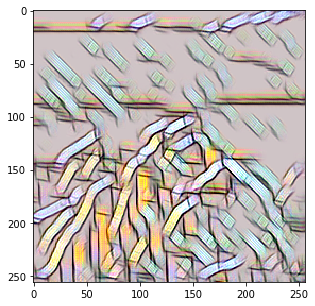

Saved sample tranformed image at /content/sample0_13000.png
========Iteration 13501/20696========
	Content Loss:	9572003.00
	Style Loss:	12494764.00
	Total Loss:	22066721.77
Time elapsed:	2229.3994266986847 seconds
Saved TransformerNetwork checkpoint file at /content/checkpoint_13500.pth


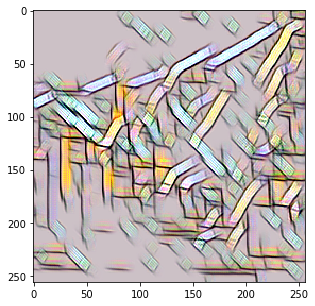

Saved sample tranformed image at /content/sample0_13500.png
========Iteration 14001/20696========
	Content Loss:	9569507.00
	Style Loss:	12221192.00
	Total Loss:	21790649.68
Time elapsed:	2311.203340768814 seconds
Saved TransformerNetwork checkpoint file at /content/checkpoint_14000.pth


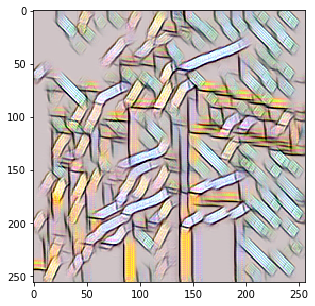

Saved sample tranformed image at /content/sample0_14000.png
========Iteration 14501/20696========
	Content Loss:	9567201.00
	Style Loss:	11963997.00
	Total Loss:	21531154.46
Time elapsed:	2393.1940920352936 seconds
Saved TransformerNetwork checkpoint file at /content/checkpoint_14500.pth


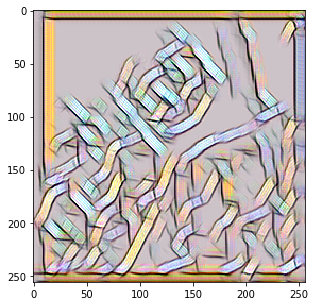

Saved sample tranformed image at /content/sample0_14500.png
========Iteration 15001/20696========
	Content Loss:	9564461.00
	Style Loss:	11722644.00
	Total Loss:	21287056.14
Time elapsed:	2475.2028198242188 seconds
Saved TransformerNetwork checkpoint file at /content/checkpoint_15000.pth


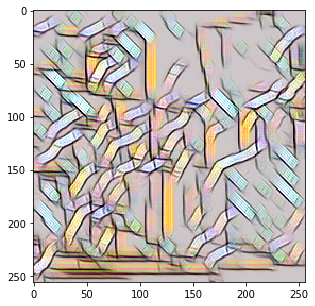

Saved sample tranformed image at /content/sample0_15000.png
========Iteration 15501/20696========
	Content Loss:	9560905.00
	Style Loss:	11496198.00
	Total Loss:	21057062.37
Time elapsed:	2557.0254220962524 seconds
Saved TransformerNetwork checkpoint file at /content/checkpoint_15500.pth


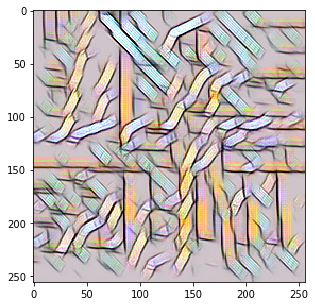

Saved sample tranformed image at /content/sample0_15500.png
========Iteration 16001/20696========
	Content Loss:	9558103.00
	Style Loss:	11281533.00
	Total Loss:	20839602.74
Time elapsed:	2638.8451285362244 seconds
Saved TransformerNetwork checkpoint file at /content/checkpoint_16000.pth


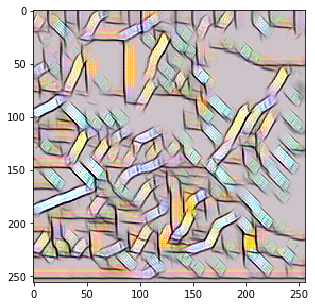

Saved sample tranformed image at /content/sample0_16000.png
========Iteration 16501/20696========
	Content Loss:	9554836.00
	Style Loss:	11079793.00
	Total Loss:	20634605.35
Time elapsed:	2720.836216688156 seconds
Saved TransformerNetwork checkpoint file at /content/checkpoint_16500.pth


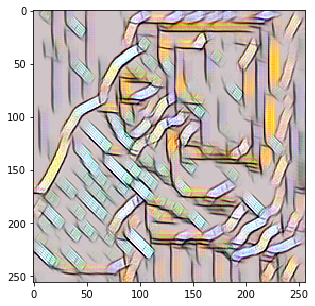

Saved sample tranformed image at /content/sample0_16500.png
========Iteration 17001/20696========
	Content Loss:	9551951.00
	Style Loss:	10889370.00
	Total Loss:	20441293.19
Time elapsed:	2803.174023628235 seconds
Saved TransformerNetwork checkpoint file at /content/checkpoint_17000.pth


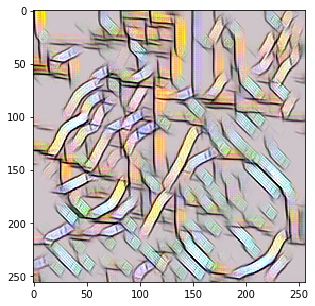

Saved sample tranformed image at /content/sample0_17000.png
========Iteration 17501/20696========
	Content Loss:	9548689.00
	Style Loss:	10709906.00
	Total Loss:	20258561.08
Time elapsed:	2884.9579520225525 seconds
Saved TransformerNetwork checkpoint file at /content/checkpoint_17500.pth


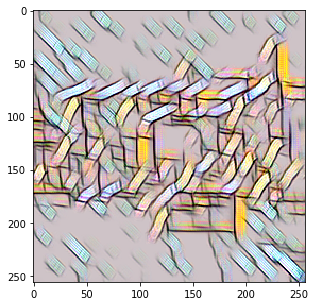

Saved sample tranformed image at /content/sample0_17500.png
========Iteration 18001/20696========
	Content Loss:	9546210.00
	Style Loss:	10540489.00
	Total Loss:	20086666.02
Time elapsed:	2966.5680248737335 seconds
Saved TransformerNetwork checkpoint file at /content/checkpoint_18000.pth


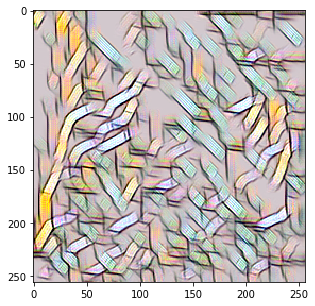

Saved sample tranformed image at /content/sample0_18000.png
========Iteration 18501/20696========
	Content Loss:	9544156.00
	Style Loss:	10382769.00
	Total Loss:	19926905.97
Time elapsed:	3048.7398586273193 seconds
Saved TransformerNetwork checkpoint file at /content/checkpoint_18500.pth


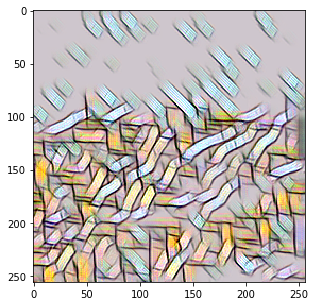

Saved sample tranformed image at /content/sample0_18500.png
========Iteration 19001/20696========
	Content Loss:	9541652.00
	Style Loss:	10228829.00
	Total Loss:	19770456.66
Time elapsed:	3130.5940532684326 seconds
Saved TransformerNetwork checkpoint file at /content/checkpoint_19000.pth


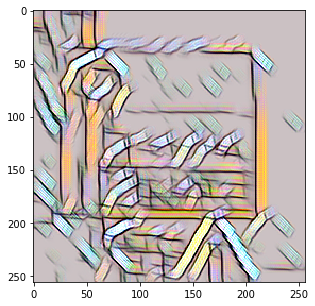

Saved sample tranformed image at /content/sample0_19000.png
========Iteration 19501/20696========
	Content Loss:	9539306.00
	Style Loss:	10082343.00
	Total Loss:	19621612.32
Time elapsed:	3212.4291956424713 seconds
Saved TransformerNetwork checkpoint file at /content/checkpoint_19500.pth


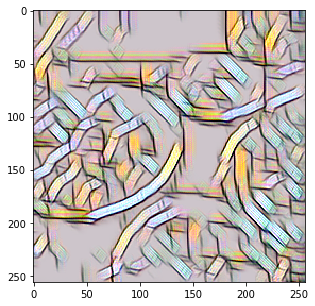

Saved sample tranformed image at /content/sample0_19500.png
========Iteration 20001/20696========
	Content Loss:	9536948.00
	Style Loss:	9942540.00
	Total Loss:	19479468.22
Time elapsed:	3294.3109312057495 seconds
Saved TransformerNetwork checkpoint file at /content/checkpoint_20000.pth


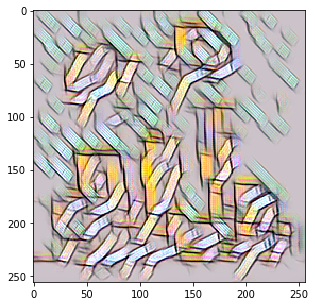

Saved sample tranformed image at /content/sample0_20000.png
========Iteration 20501/20696========
	Content Loss:	9534625.00
	Style Loss:	9808696.00
	Total Loss:	19343292.65
Time elapsed:	3377.463145971298 seconds
Saved TransformerNetwork checkpoint file at /content/checkpoint_20500.pth


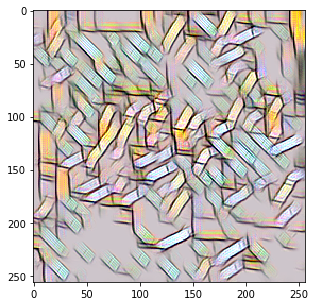

Saved sample tranformed image at /content/sample0_20500.png
========Iteration 20696/20696========
	Content Loss:	9533781.00
	Style Loss:	9758154.00
	Total Loss:	19291902.83
Time elapsed:	3409.7737908363342 seconds
Saved TransformerNetwork checkpoint file at /content/checkpoint_20695.pth


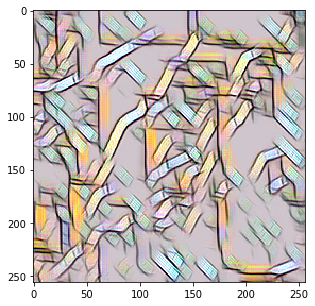

Saved sample tranformed image at /content/sample0_20695.png
Done Training the Transformer Network!
Training Time: 3410.0696320533752 seconds
========Content Loss========
[204028512.0, 118443897.24550898, 81827004.36763237, 65259774.482345104, 55202226.08495752, 48591773.475409836, 43928138.54715095, 40402016.15309911, 37640419.2011997, 35421039.2946012, 33597335.71225755, 32078795.94291947, 30786438.574404266, 29669577.881710507, 28691746.149121553, 27834087.05799227, 27066992.10223722, 26381562.48806023, 25761659.974225085, 25197971.90779918, 24687520.510548946, 24217481.02056947, 23785900.090719026, 23389827.836362056, 23021530.553953838, 22682652.341332693, 22363819.39673871, 22066721.7660914, 21790649.684093993, 21531154.461623337, 21287056.137057528, 21057062.3692665, 20839602.738828823, 20634605.34700927, 20441293.190400563, 20258561.07565282, 20086666.01861008, 19926905.969190855, 19770456.65575496, 19621612.316137634, 19479468.220238987, 19343292.651919417, 19291902.833880942]


In [4]:
def train():
    # Seeds
    torch.manual_seed(SEED)
    torch.cuda.manual_seed(SEED)
    np.random.seed(SEED)
    random.seed(SEED)

    # Device
    device = ("cuda" if torch.cuda.is_available() else "cpu")

    # Dataset and Dataloader
    transform = transforms.Compose([
        transforms.Resize(TRAIN_IMAGE_SIZE),
        transforms.CenterCrop(TRAIN_IMAGE_SIZE),
        transforms.ToTensor(),
        transforms.Lambda(lambda x: x.mul(255))
    ])
    train_dataset = datasets.ImageFolder(DATASET_PATH, transform=transform)
    train_loader = torch.utils.data.DataLoader(train_dataset, batch_size=BATCH_SIZE, shuffle=True)

    # Load networks
    #TransformerNetwork = transformer.TransformerNetwork().to(device)
    TransformerNetwork = experimental.TransformerResNextNetwork_Pruned(0.3).to(device)
    VGG = vgg.VGG16('/content/vgg16-00b39a1b.pth').to(device)

    # Get Style Features
    imagenet_neg_mean = torch.tensor([-103.939, -116.779, -123.68], dtype=torch.float32).reshape(1,3,1,1).to(device)
    imagenet_mean = torch.tensor([103.939, 116.779, 123.68], dtype=torch.float32).reshape(1,3,1,1).to(device)
    style_image = utils.load_image(STYLE_IMAGE_PATH)
    style_tensor = utils.itot(style_image).to(device)
    style_tensor = style_tensor.add(imagenet_neg_mean)
    B, C, H, W = style_tensor.shape
    style_features = VGG(style_tensor.expand([BATCH_SIZE, C, H, W]))
    style_gram = {}
    for key, value in style_features.items():
        style_gram[key] = utils.gram(value)

    # Optimizer settings
    optimizer = optim.Adam(TransformerNetwork.parameters(), lr=ADAM_LR)

    # Loss trackers
    content_loss_history = []
    style_loss_history = []
    total_loss_history = []
    batch_content_loss_sum = 0
    batch_style_loss_sum = 0
    batch_total_loss_sum = 0

    # Optimization/Training Loop
    batch_count = 1
    start_time = time.time()
    for epoch in range (1, NUM_EPOCHS+1):
        print("========Epoch {}/{}========".format(epoch, NUM_EPOCHS+1))
        for batch_id, (content_batch, _) in enumerate(train_loader):
            # Current Batch size in case of odd batches
            curr_batch_size = content_batch.shape[0]
            
            # Zero-out Gradients
            optimizer.zero_grad()

            # Generate images and get features
            content_batch = content_batch[:,[2,1,0]].to(device)
            generated_batch = TransformerNetwork(content_batch)
            content_features = VGG(content_batch.add(imagenet_neg_mean))
            generated_features = VGG(generated_batch.add(imagenet_neg_mean))

            # Content Loss
            MSELoss = nn.MSELoss().to(device)
            content_loss = CONTENT_WEIGHT * MSELoss(content_features['relu2_2'], generated_features['relu2_2'])            
            batch_content_loss_sum += content_loss

            # Style Loss
            style_loss = 0
            for key, value in generated_features.items():
                s_loss = MSELoss(utils.gram(value), style_gram[key][:curr_batch_size])
                style_loss += s_loss
            style_loss *= STYLE_WEIGHT
            batch_style_loss_sum += style_loss

            # Total Loss
            total_loss = content_loss + style_loss
            batch_total_loss_sum += total_loss.item()

            # Backprop and Weight Update
            total_loss.backward()
            optimizer.step()

            # Save Model and Print Losses
            if (((batch_count-1)%SAVE_MODEL_EVERY == 0) or (batch_count==NUM_EPOCHS*len(train_loader))):
                # Print Losses
                print("========Iteration {}/{}========".format(batch_count, NUM_EPOCHS*len(train_loader)))
                print("\tContent Loss:\t{:.2f}".format(batch_content_loss_sum/batch_count))
                print("\tStyle Loss:\t{:.2f}".format(batch_style_loss_sum/batch_count))
                print("\tTotal Loss:\t{:.2f}".format(batch_total_loss_sum/batch_count))
                print("Time elapsed:\t{} seconds".format(time.time()-start_time))

                # Save Model
                checkpoint_path = SAVE_MODEL_PATH + "checkpoint_" + str(batch_count-1) + ".pth"
                torch.save(TransformerNetwork.state_dict(), checkpoint_path)
                print("Saved TransformerNetwork checkpoint file at {}".format(checkpoint_path))

                # Save sample generated image
                sample_tensor = generated_batch[0].clone().detach().unsqueeze(dim=0)
                sample_image = utils.ttoi(sample_tensor.clone().detach())
                sample_image_path = SAVE_IMAGE_PATH + "sample0_" + str(batch_count-1) + ".png"
                utils.saveimg(sample_image, sample_image_path)
                utils.show(sample_image)
                print("Saved sample tranformed image at {}".format(sample_image_path))

                # Save loss histories
                content_loss_history.append(batch_total_loss_sum/batch_count)
                style_loss_history.append(batch_style_loss_sum/batch_count)
                total_loss_history.append(batch_total_loss_sum/batch_count)

            # Iterate Batch Counter
            batch_count+=1

    stop_time = time.time()
    # Print loss histories
    print("Done Training the Transformer Network!")
    print("Training Time: {} seconds".format(stop_time-start_time))
    print("========Content Loss========")
    print(content_loss_history) 
    print("========Style Loss========")
    print(style_loss_history) 
    print("========Total Loss========")
    print(total_loss_history) 

    # Save TransformerNetwork weights
    TransformerNetwork.eval()
    TransformerNetwork.cpu()
    final_path = SAVE_MODEL_PATH + "transformer_weight.pth"
    print("Saving TransformerNetwork weights at {}".format(final_path))
    torch.save(TransformerNetwork.state_dict(), final_path)
    print("Done saving final model")

train()